<a href="https://colab.research.google.com/github/ferate/DeepLearning/blob/main/DinazoruBul.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # repostory'i klonluyoruz
%cd yolov5
%pip install -qr requirements.txt # gerekli kütüphaneleri install ediyoruz
%pip install -q roboflow #roboflow u install ediyoruz

import torch
import os
from IPython.display import Image, clear_output  # resimleri görüntülemek için

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})") #hangi ekran kartını kullandığımızı yazdırıyoruz

Cloning into 'yolov5'...
remote: Enumerating objects: 12281, done.
remote: Total 12281 (delta 0), reused 0 (delta 0), pack-reused 12281
Receiving objects: 100% (12281/12281), 12.02 MiB | 14.74 MiB/s, done.
Resolving deltas: 100% (8475/8475), done.
/content/yolov5
     |████████████████████████████████| 596 kB 6.9 MB/s 
     |████████████████████████████████| 145 kB 7.8 MB/s 
     |████████████████████████████████| 178 kB 65.9 MB/s 
     |████████████████████████████████| 1.1 MB 56.6 MB/s 
     |████████████████████████████████| 67 kB 7.2 MB/s 
     |████████████████████████████████| 54 kB 3.3 MB/s 
     |████████████████████████████████| 138 kB 72.6 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.28.0 which is incompatible.
datasci

In [4]:
from roboflow import Roboflow 
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [5]:
# environment'ı kuruyoruz
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [6]:
#roboflowdan aldığımız api kodlarını kopyalıyoruz çalıştırınca indirecek
rf = Roboflow(api_key="whj1IsvctXGUUhBxMu9f")
project = rf.workspace("derinogrenme").project("dinazor")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Dinazor-1 in yolov5pytorch:: 100%|██████████| 238/238 [00:00<00:00, 1335.84it/s]


In [7]:
# 416 resmi 16 lık batchler halinde 100 epochda eğitecek saatler sürebilir lütfen sabırlı olun ve aralıklarla ekranın kapanmaması için ekrana basınız.
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Dinazor-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_

In [8]:
# tensorboard'ı başlatıyoruz

#"runs" isimli dosyanın içine kaydediyoruz
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [33]:
#test resimlerimizi modele sokuyoruz ve sonuçlar en sonda belirtilen dosya konumuna kaydediliyor
#her farklı resim veya video eklediğinizde en sondaki exp1 exp2 diye artar. runs/detect/exp
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.70 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/Dinazor-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/11 /content/datasets/Dinazor-1/valid/images/001.JPG: 320x416 1 Dinazor, Done. (0.016s)
image 2/11 /content/datasets/Dinazor-1/valid/images/002.JPG: 320x416 1 Dinazor, Done. (0.012s)
image 3/11 /content/datasets/Dinazor-1/valid/images/003.JPG: 416x320 1 Dinazor, Done. (0.015s)
image 4/11 /content/datasets/Dinazor-1/valid/images/

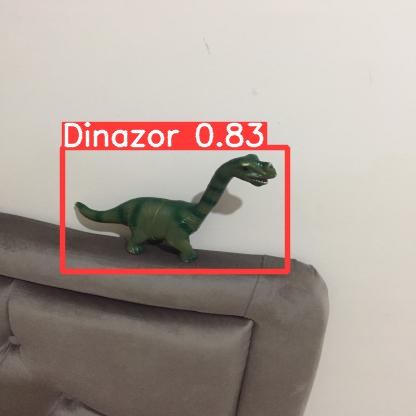

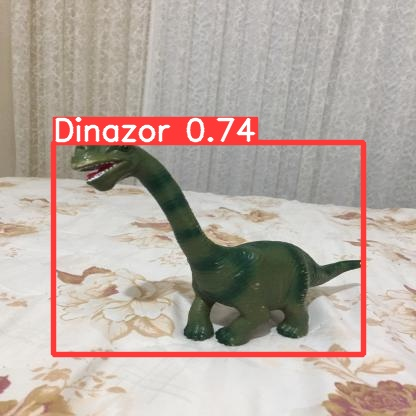

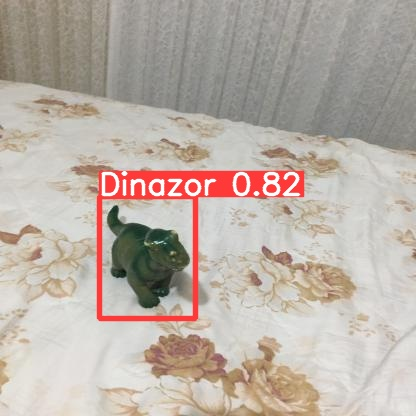

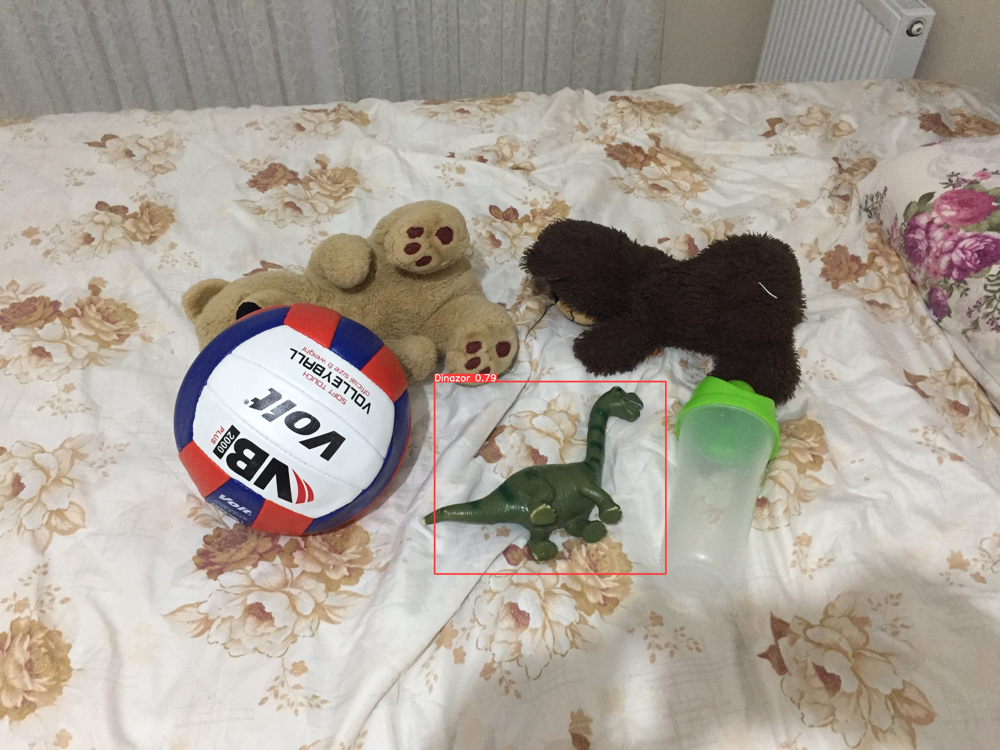

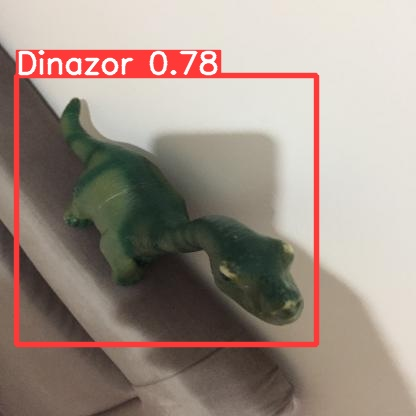

In [34]:
#modelden çıkmış olan tüm test verilerini ekrana bastırarak sonuçları inceliyoruz.

import glob
from IPython.display import Image, display

i = 0
# lütfen glob.glob un içine doğru dosya konumunu yazınız üst satırda en altta yazan results saved to runs/detects/exp1 veya runs/detects/exp2 veya runs/detects/exp3
for imageName in glob.glob('/content/yolov5/runs/detect/exp13/*.jpg'): #dosya uzantısını resimlerinizin formatına göre değiştirin jpg olmak zorunda değil.
    i += 1

    if i < 12:
      display(Image(filename=imageName))
      print("\n")

In [ ]:
#Modelin ağırlıklarını daha sonra kullanmak için bilgisayarımıza kaydediyoruz
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>